This notebook is dedicated to best-fit a distribution function that is based on log-normals and is linearly mixed with other log-normals. These best-fit distributions are used to sample the abundances from, therefore, minimizing the OOD samples from the trained generator models.


### Defining the Functions

#### Defining the Model Related Stuff

In [8]:
# Define all the model classes
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as D
import numpy as np
"""
The base class for all mixture models, was implemented because in the past, other mixture models using Dirichlet and Normal have
been explored and decomissioned, therefore, although this class is very rigorous in structure (and a slight overkill), it could be  
useful for future extensions and experiments with other mixture models, therefore, it is kept in the codebase for now, but it can 
be restructured into LogNormalMixture class if deemed unnecessary.
"""
class MixtureModel(nn.Module):
    def __init__(self, n_mix:(int), n_components:(int)=3):
        """
        Base class for mixture models, handles mixing weights and BIC calculation

        Args:
            n_mix (int): Number of mixture components
            n_components (int): Dimensionality of each component (3 for this project since we have 3 abundances)
        """
        super().__init__()
        self.n_components = n_components
        self.n_mix = n_mix
        self.mix_logits = nn.Parameter(torch.zeros(n_mix)) # Mixing weights (logits)

    # Softmax mixes the mix_logits, to get valid probabilities ensures the sum is 1 and all are positive
    def get_mix_weights(self):
        return F.softmax(self.mix_logits, dim=0)

    # Gets the BIC score of the model for the given data, used for model selection
    def bic(self, data):
        # Number of data points
        n = data.shape[0]
        # Number of parameters; mix_logits:(n_mix - 1) + mus:(n_mix * n_components) + Ls:(n_mix * n_components * (n_components + 1) / 2)
        k = sum(p.numel() for p in self.parameters())
        log_lik = -self.loss(data) * n # loss is neg log likelihood
        return k * np.log(n) - 2 * log_lik.item() # Return BIC score

class LogNormalMixture(MixtureModel):
    def __init__(self, n_mix:(int), init_mus:(bool)=None, n_components:(int)=3, EPS:(float)=1e-7):
        super().__init__(n_mix, n_components)

        # Initialize mus with provided values (from KMeans clusters) or randomly, shape (n_mix, n_components)
        if init_mus is not None:
            self.mus = nn.Parameter(init_mus)
        else:
            self.mus = nn.Parameter(torch.randn(n_mix, n_components))
        # Initialize the Ls as identity matrices for each component, shape (n_mix, n_components, n_components)
        self.Ls = nn.Parameter(torch.eye(n_components).unsqueeze(0).repeat(n_mix, 1, 1))
        self.EPS = EPS

    # Get the scale_tril matrices for each component, ensuring positive diagonal entries for valid covariance
    # Must use this to ensure SPD to learn full covariance matrices.
    def get_scale_trils(self):
        L = torch.tril(self.Ls)
        diag = torch.diagonal(L, dim1=-2, dim2=-1)
        off_diag = L - torch.diag_embed(diag)
        pos_diag = F.softplus(diag) + 1e-5
        return off_diag + torch.diag_embed(pos_diag)

    # Forward pass to compute log likelihood of the data under the model
    def forward(self, x):
        # Get a bunch of intermediate variables to compute the log likelihood
        x_safe = torch.clamp(x, min=self.EPS) # Clamp the data just to be safe, since dataset has some 0 entries, since log(0) is undefined
        weights = self.get_mix_weights() # Get the weights for each component, shape (n_mix,)
        scale_trils = self.get_scale_trils() # Get the scale_tril matrices for each component, shape (n_mix, 3, 3)
        log_x = torch.log(x_safe) # Log-transform the data, shape (n_spectra=1723, n_endmembers=3)
        sum_log_x = torch.sum(log_x, dim=1) # Jacobian term for the change of variables, shape (n_spectra=1723,)
        
        # Vectorized Multivariate Normal, using the centers, and the shape matrices for the covariances, shape (n_mix, 3) and (n_mix, 3, 3) respectively
        dist = D.MultivariateNormal(self.mus, scale_tril=scale_trils) # Final shape (n_mix, n_endmemberss=3)
        
        # Use unsqueeze on log_x to get (1, 1723, 210) from (1723, 210), and then the dist.log_prob will broadcast to (n_mix, 1723) for
        # each component and each spectrum, then we subtract the Jacobian term, which is (1723,) and will also broadcast to (n_mix, 1723)
        lp = dist.log_prob(log_x.unsqueeze(1)) - sum_log_x.unsqueeze(1) # Final shape (n_mix, 1723)
        
        return torch.logsumexp(lp + torch.log(weights), dim=1) # Log-sum-exp to mix the components, final shape (1723,)

    # The loss function for the training procedure, negative log likelihood of the data under the model
    def loss(self, x):
        return -self.forward(x).mean() # Gets the negative log likelihood, mean over the samples (1723 spectra)
    
    # Gets the parameters of the model in a dictionary format, useful for saving and logging after training
    def get_params(self):
        return {
            'mix_weights': self.get_mix_weights().detach().cpu().numpy(),
            'mus': self.mus.detach().cpu().numpy(),
            'Ls': self.Ls.detach().cpu().numpy()
        }

In [9]:
# Define the model training functions
import torch.optim as optim
from sklearn.cluster import KMeans
import json

class NumpyEncoder(json.JSONEncoder):
    """json encoder for numpy types """
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        if isinstance(obj, np.float32):
            return float(obj)
        return super(NumpyEncoder, self).default(obj)

def save_params(params_history, filename): 
    """Saves params"""
    with open(filename, 'w') as f:
        # Pass the custom encoder class to json.dump
        json.dump(params_history, f, indent=2, cls=NumpyEncoder)

def get_kmeans_centroids(data:(torch.Tensor), n_clusters:(int), max_iter:(int)=100) -> torch.Tensor:
    """
    Gets the KMeans centroids for the data using SciKit-Learn KMeans, this allows
    for better inits of the mus for the mixture model, imporivng convergence, final performance,
    and reduces the posibility of vanishing grads for all terms.

    Args:
        data (torch.Tensor): The input data for which to find centroids, shape usually (1723, 3)
        n_clusters (int): The number of clusters to find, equal to the number of mixture components (represented as "K")
        max_iter (int): Maximum number of iterations for KMeans to converge, defaulted at 100
    
    Returns:
        centroids (torch.Tensor): The centroids found by KMeans, with shape (n_clusters, 3)
    """
    # Convert the data log-space for finding centroids since mus are in log-space
    data = torch.log(data + 1e-6) 
    # Detach and make CPU and np for KMeans
    data_np = data.detach().cpu().numpy()
    
    # Create the KMeans model
    kmeans = KMeans(
        n_clusters=n_clusters,
        init="k-means++",
        n_init=5,
        max_iter=max_iter,
        random_state=None
    )
    # Fit the KMeans model to the data
    kmeans.fit(data_np)
    # Get the centroids from the fitted model and convert back to torch
    centroids = torch.from_numpy(kmeans.cluster_centers_).float()
    centroids = centroids.to(data.device)
    
    return centroids

def fit_model(model_class:(nn.Module), data:(torch.Tensor), device:(torch.device), n_mix:(int), steps:(int)=2000, lr:(float)=0.01, smart_init:(bool)=True) -> nn.Module:
    """
    The training script for a single model/start, this is called multiple times for each K to find the best model for single K.
    Uses Adam optimizer and Cosine Annealing for optimizer and scheduler, if enabled, it uses KMeans centroids for better inits.
    
    Args:
        model_class (nn.Module): The class of the model to be trained, e.g. LogNormalMixture
        data (torch.Tensor): The input data for training, (1723, 3) for the data used in the paper
        device (torch.device): The device to run the training on, e.g. torch.device("cpu") or torch.device("cuda")
        n_mix (int): The number of mixture components (K) to use for this training run
        steps (int): The number of training steps/iterations to perform, defaulted at 2000
        lr (float): The learning rate for the optimizer, defaulted at 0.01
        smart_init (bool): Whether to use KMeans centroids for initializing

    Returns:
        model (nn.Module): The trained model after the specified number of steps
    """
    init_mus=None
    if smart_init:
        init_mus = get_kmeans_centroids(data, n_mix).to(device)

    # Initialize the model, optimizer, and scheduler
    model = model_class(n_mix, init_mus=init_mus).to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=steps, eta_min=1e-5)
    
    # The main training loop, usual stuff (has scheduler)
    for _ in range(steps):
        optimizer.zero_grad()
        loss = model.loss(data)
        loss.backward()
        optimizer.step()
        scheduler.step()
        
    return model

def find_best_model(model_class:(nn.Module), data:(torch.Tensor), device:(torch.device), params_savename:(str), max_mix:(int)=50, n_restarts:(int)=7, steps:(int)=2000, lr:(float)=0.01, smart_init:(bool)=True) -> nn.Module | int | float | list[float] | list[nn.Module]:
    """
    The main function to find the best model across multiple K values and random restarts, called to find the params for the abundance generators

    Args:
        model_class (nn.Module): The class of the model to be trained, e.g. LogNormalMixture
        data (torch.Tensor): The input data for training, (1723, 3) for the data used in the paper
        device (torch.device): The device to run the training on, e.g. torch.device("cpu") or torch.device("cuda")
        params_savename (str): The filename (without extension) to save the params history for all models
        max_mix (int): The maximum number of mixture components (K) to try, defaulted at 50
        n_restarts (int): The number of random restarts to perform for each K, defaulted at 7
        steps (int): The number of training steps/iterations to perform for each model, defaulted at 2000
        lr (float): The learning rate for the optimizer, defaulted at 0.01
        smart_init (bool): Whether to use KMeans centroids for initializing the mus for each model, defaulted at True
    
    Returns:
        best_model (nn.Module): The best model found across all K and restarts, based on BIC score
        best_k (int): The number of mixture components (K) for the best model
        best_bic (float): The BIC score for the best model
        bic_history (list[float]): A list of the best BIC scores for each K tried, useful for plotting the BIC graph later
        model_history (list[nn.Module]): A list of the best models for each K tried, useful for analysis and plotting later
    """
    # Initialize the vars to keep track of the best models and the BIC scores/K val, also initialize the history lists/dict for later analysis and plotting
    best_bic = float('inf')
    best_model = None
    best_k = 0
    bic_history = [] 
    model_history = []
    params_history = {}

    print(f"Searching {model_class.__name__}:")
    # Loop that goes from K=1 to max_mix, for each K, it restarts the model n_restart times and keeps the best model for that K
    for n_mix in range(1, max_mix + 1):
        # Initialize the vars to keep track of the best model for this specific K across the restarts
        best_bic_for_k = float('inf')
        best_model_for_k = None
        # Restart for n_restart times
        for _ in range(1, n_restarts+1):
            # Fit the model of that K
            model = fit_model(model_class, data, device, n_mix=n_mix, steps=steps, lr=lr, smart_init=smart_init)
            # Get the BIC of the fitted model
            bic = model.bic(data)
            # Keep it, if it is the best restarted model for this K
            if bic < best_bic_for_k:
                best_bic_for_k = bic
                best_model_for_k = model
            print(f"Restart {_} for K={n_mix}, BIC={bic:.2f}", end=".. ")
        
        # If all restarts failed (rare), skip
        if best_model_for_k is None: print("All restarts failed for K =", n_mix); continue
        # Append the best BIC and model for this K to the history lists
        bic_history.append(best_bic_for_k)
        model_history.append(best_model_for_k)
        params_history[str(n_mix)] = best_model_for_k.get_params()
        
        # Check if this K is the global best so far, if so, make the switch
        if best_bic_for_k < best_bic:
            best_bic = best_bic_for_k
            best_model = best_model_for_k
            best_k = n_mix
        print(f"Finished {n_mix}")
        
    # Show the best overall model throughout all Ks and restarts
    print(f"\nBest {model_class.__name__}: K={best_k}, BIC={best_bic:.2f}")
    # Save the params to the given params_savename
    save_params(params_history, f"{params_savename}.json")
    
    return best_model, best_k, best_bic, bic_history, model_history, params_history

#### Defining the Plotting and Utilities

In [ ]:
# Defining plots

import matplotlib.pyplot as plt
import matplotlib.tri as tri

# Plots the Bayesian Information Content curve with changing K
def plot_bic_curve(bic_history, best_k):
    # Manufacture a list of K valus
    k_list = list(range(1, len(bic_history) + 1))
    plt.figure(figsize=(10,5))
    plt.plot(k_list, bic_history, marker="o") # Plot all the BICs vs Ks
    plt.scatter([best_k], [bic_history[best_k-1]], 
                color="red", s=150, marker="o",
                label=f"Best K={best_k}", zorder=10) # Highlight the best K val
    plt.xlabel("Number of Components (K)")
    plt.ylabel("BIC (lower is better)")
    plt.title("Log-Normal Mixture Model Selection")
    plt.legend()
    plt.grid(True)
    plt.show()

def barycentric_to_cartesian(baryc):
    # Converts barycentric coordinates to cartesian
    a, b, c = baryc[:,0], baryc[:,1], baryc[:,2]
    x = 0.5 * (2*b + c)
    y = (np.sqrt(3)/2) * c
    return x, y

def simplex_grid(steps=200):
    # Makes a grid for the simplex (abundance space)
    a = np.linspace(0, 1, steps)
    b = np.linspace(0, 1, steps)
    A, B = np.meshgrid(a, b)
    mask = (A + B) <= 1
    A, B = A[mask], B[mask]
    C = 1 - A - B
    return np.stack([A, B, C], axis=1)

def plot_simplex_model(model, data, title, percentile=0.95, n_levels=150):
    # Get the grid
    grid = simplex_grid(300)
    grid_t = torch.tensor(grid, dtype=torch.float32, device=data.device)
    # Get thge pdf
    with torch.no_grad():
        pdf = torch.exp(model.forward(grid_t)).cpu().numpy()
    # Create grid and datapoints
    gx, gy = barycentric_to_cartesian(grid)
    dx, dy = barycentric_to_cartesian(data.cpu().numpy())
    # Create the corners
    corners = np.array([[1,0,0],[0,1,0],[0,0,1],[1,0,0]])
    cx, cy = barycentric_to_cartesian(corners)
    # Clip the PDF, create the levels
    vmax = np.percentile(pdf, percentile)
    levels = np.linspace(0, vmax, n_levels)
    # Baselines for plotting
    triang = tri.Triangulation(gx, gy)
    fig, axes = plt.subplots(1,3, figsize=(15,5))
    names = ["Heatmap", "Points", "Points + Heatmap"]
    # Create the plots in loop
    for i, ax in enumerate(axes):
        ax.plot(cx, cy, "k-", lw=2)
        ax.set_aspect("equal")
        ax.axis("off")
        ax.set_title(names[i])
        if "Heatmap" in names[i]:
            ax.tricontourf(triang, pdf, levels=levels, cmap="viridis", zorder=5)
        if "Points" in names[i]:
            ax.scatter(dx, dy, s=3, c="red", alpha=0.4, zorder=10)
    # Create the title
    axes[0].text(-0.15, 0.5, title, rotation=90,
                 transform=axes[0].transAxes,
                 fontsize=12, fontweight="bold")
    plt.show()

def plot_all_simplexes(model_history, bic_history, abundances, start, percentile=95, levels=150):
    # Plot all the simplexes from the given models starting at start
    for k, model in enumerate(model_history, start=start):
        bic = bic_history[k-1]
        plot_simplex_model(
            model,
            abundances,
            title=f"LogNormal Mix\nK={k}, BIC={int(bic)}",
            percentile=percentile,
            n_levels=levels
        )

### Finding the Distribution

In [11]:
# Data and device

from pathlib import Path
import torch
import pandas as pd

# Get device
device_str = "cuda" if torch.cuda.is_available() else "cpu"
device = torch.device(device_str)
print(f"Using device: {device_str}")

# Get the abundance tensor
github_root = Path.cwd().resolve().parents[1]
save_path = rf"{github_root}\data\simpler_data_rwc.csv"
df = pd.read_csv(save_path)
abundances = df[["gv_fraction","npv_fraction","soil_fraction"]].values.astype("float32")
abundances = torch.from_numpy(abundances)

# Clamp the data to remove the mathematical impossibility of log(0), move data to device, this is already done internally, but do this just to be safe
EPS = 1e-7 # Machine eps for the current setup
abundances = torch.clamp(abundances, min=EPS)
abundances = abundances.to(dtype=torch.float32, device=device)

Using device: cuda


#### With Smart Inits

In [12]:
# Training models with smart initialization, with K_max=50, 5 restarts each, 2000 steps, and initial lr 1e-2
best_model_smart, best_k_smart, best_bic_smart, bic_history_smart, model_history_smart, params_history_smart = find_best_model(LogNormalMixture, abundances, device, params_savename="lognormal_params_smartinit", max_mix=50, n_restarts=5, steps=2000, lr=0.01, smart_init=True)

Searching LogNormalMixture:
Restart 1 for K=1, BIC=-20134.13.. Restart 2 for K=1, BIC=-20134.13.. Restart 3 for K=1, BIC=-20134.13.. Restart 4 for K=1, BIC=-20134.13.. Restart 5 for K=1, BIC=-20134.13.. Finished 1
Restart 1 for K=2, BIC=-42863.20.. Restart 2 for K=2, BIC=-42853.85.. Restart 3 for K=2, BIC=-42853.85.. Restart 4 for K=2, BIC=-42937.03.. Restart 5 for K=2, BIC=-42747.91.. Finished 2
Restart 1 for K=3, BIC=-22448.67.. Restart 2 for K=3, BIC=-51109.84.. Restart 3 for K=3, BIC=-50844.35.. Restart 4 for K=3, BIC=-52356.88.. Restart 5 for K=3, BIC=-51179.39.. Finished 3
Restart 1 for K=4, BIC=-54858.04.. Restart 2 for K=4, BIC=-54890.27.. Restart 3 for K=4, BIC=-53878.07.. Restart 4 for K=4, BIC=-57596.49.. Restart 5 for K=4, BIC=-54808.96.. Finished 4
Restart 1 for K=5, BIC=-57866.85.. Restart 2 for K=5, BIC=-56565.73.. Restart 3 for K=5, BIC=-57213.79.. Restart 4 for K=5, BIC=-57213.79.. Restart 5 for K=5, BIC=-57725.29.. Finished 5
Restart 1 for K=6, BIC=-57093.17.. Restart

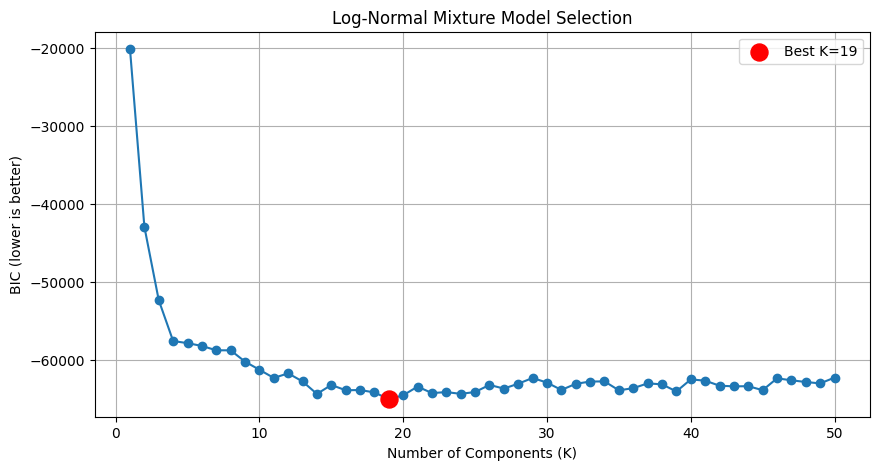

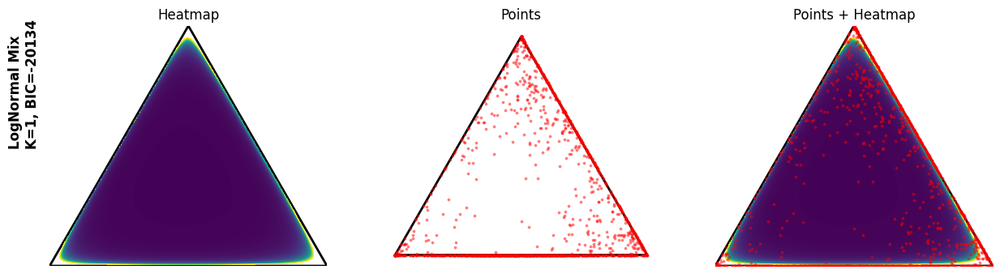

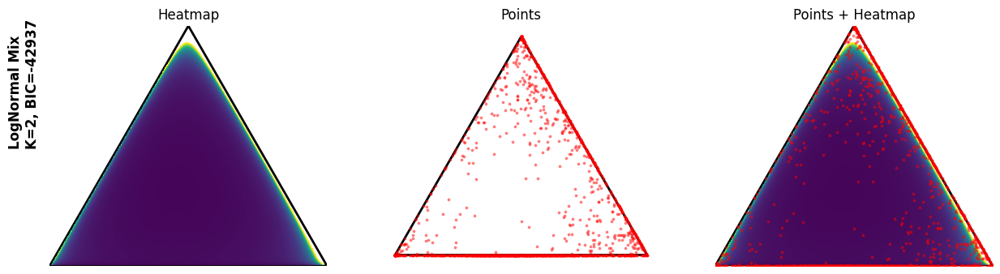

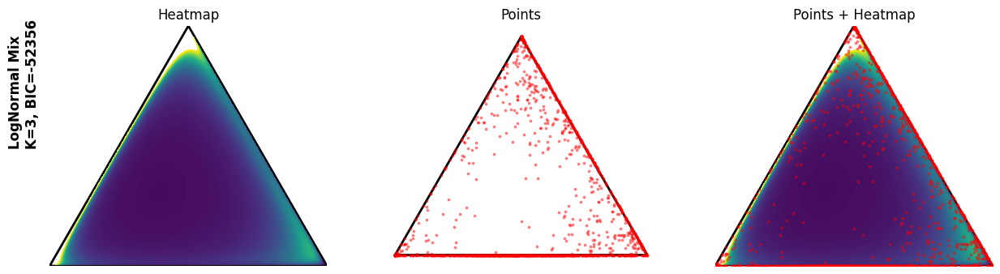

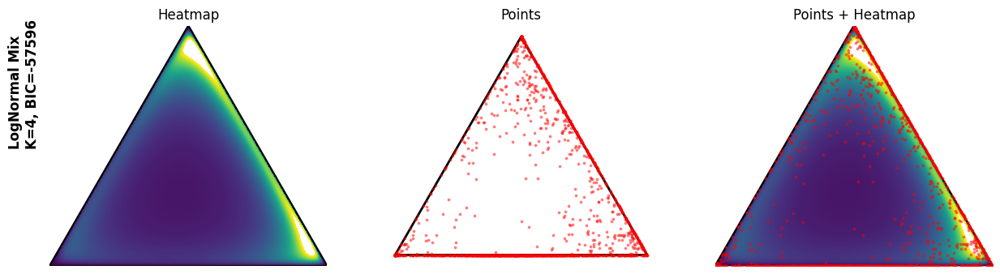

...

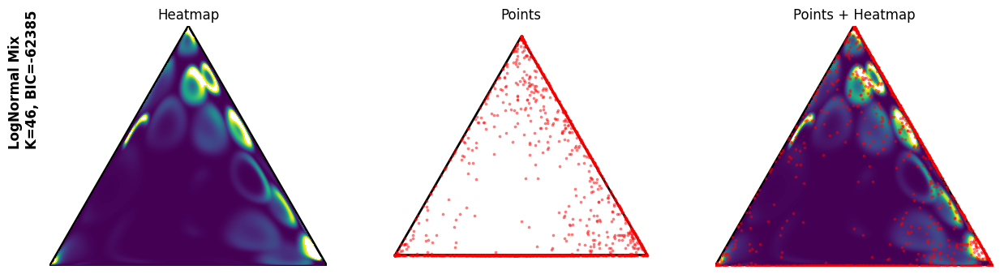

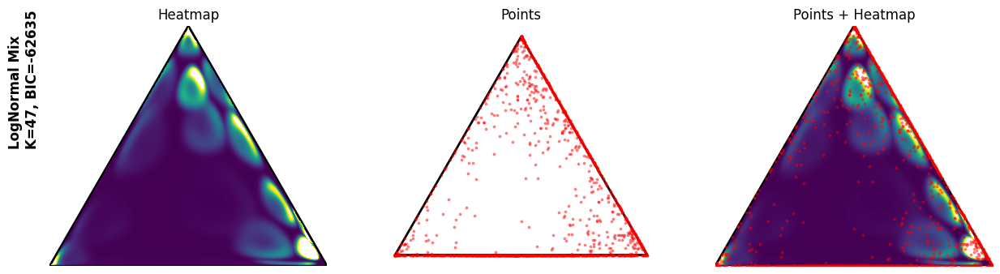

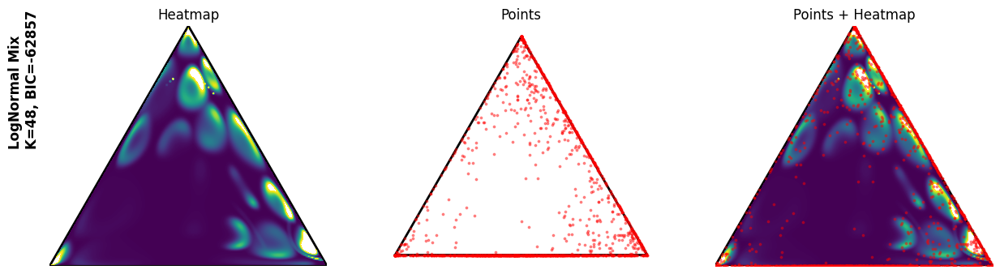

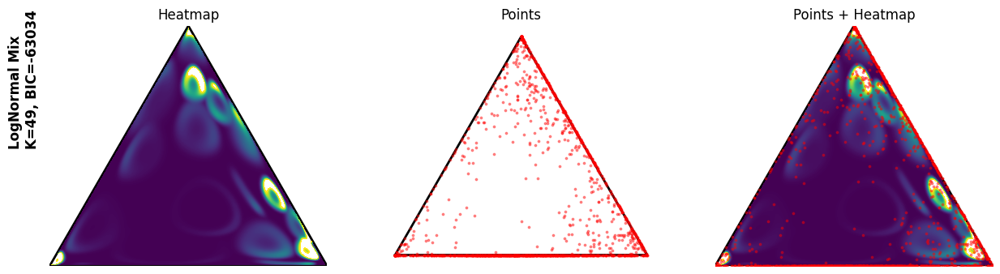

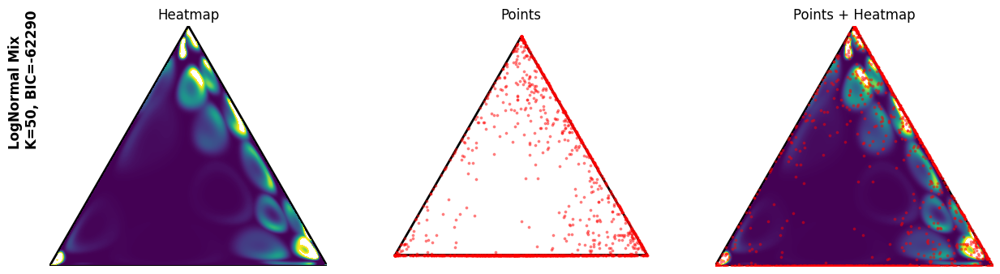

In [28]:
# Plot the results for KMeans inits
plot_bic_curve(bic_history_smart, best_k_smart)
plot_all_simplexes(model_history_smart, bic_history_smart, abundances, 1, 95, 300)

#### With Rand Inits

In [13]:
# Training models with random initialization, with K_max=50, 5 restarts each, 2000 steps, and initial lr 1e-2
best_model_rand, best_k_rand, best_bic_rand, bic_history_rand, model_history_rand, params_history_rand = find_best_model(LogNormalMixture, abundances, device, params_savename="lognormal_params_randinit", max_mix=50, n_restarts=5, steps=2000, lr=0.01, smart_init=False)

Searching LogNormalMixture:
Restart 1 for K=1, BIC=-13281.23.. Restart 2 for K=1, BIC=-16522.87.. Restart 3 for K=1, BIC=-16636.72.. Restart 4 for K=1, BIC=-16005.11.. Restart 5 for K=1, BIC=-16729.89.. Finished 1
Restart 1 for K=2, BIC=-22588.26.. Restart 2 for K=2, BIC=-21069.42.. Restart 3 for K=2, BIC=-24711.42.. Restart 4 for K=2, BIC=-21425.35.. Restart 5 for K=2, BIC=-23630.52.. Finished 2
Restart 1 for K=3, BIC=-24564.41.. Restart 2 for K=3, BIC=-23970.71.. Restart 3 for K=3, BIC=-23287.05.. Restart 4 for K=3, BIC=-25884.28.. Restart 5 for K=3, BIC=-21525.58.. Finished 3
Restart 1 for K=4, BIC=-25225.58.. Restart 2 for K=4, BIC=-26420.61.. Restart 3 for K=4, BIC=-23781.70.. Restart 4 for K=4, BIC=-27691.15.. Restart 5 for K=4, BIC=-23973.09.. Finished 4
Restart 1 for K=5, BIC=-27653.39.. Restart 2 for K=5, BIC=-23997.33.. Restart 3 for K=5, BIC=-29798.56.. Restart 4 for K=5, BIC=-28332.85.. Restart 5 for K=5, BIC=-28036.09.. Finished 5
Restart 1 for K=6, BIC=-29551.64.. Restart

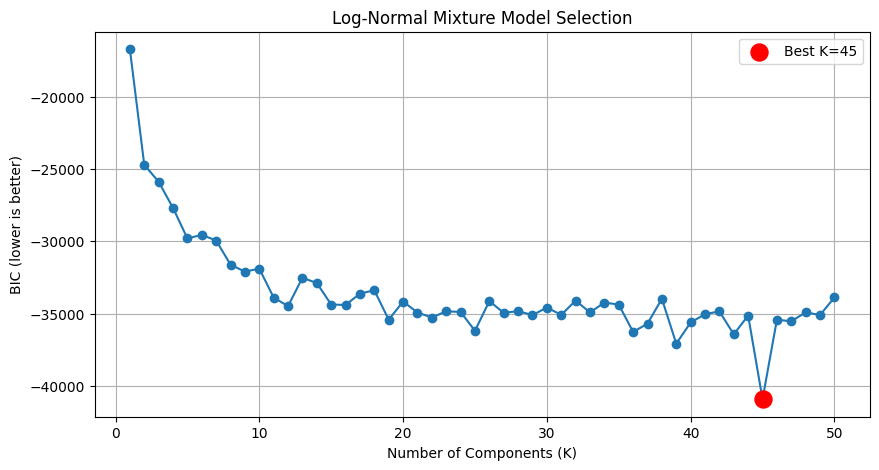

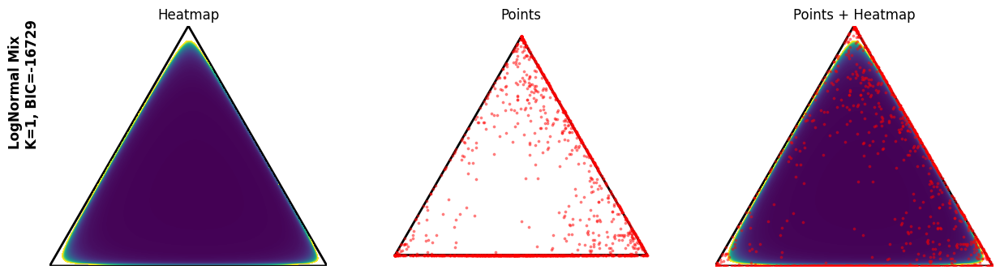

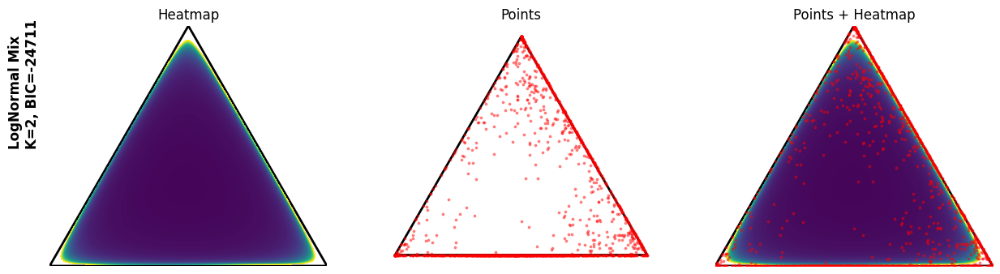

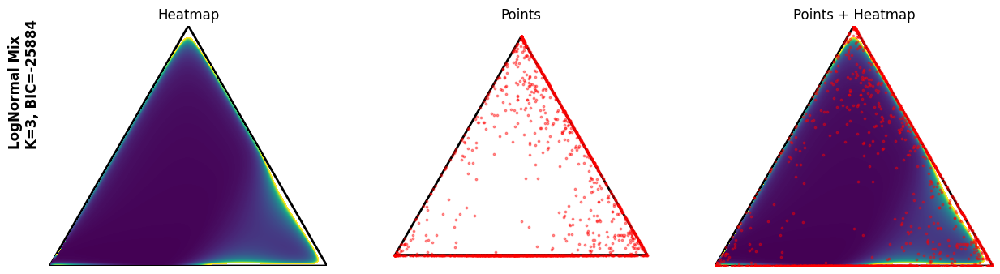

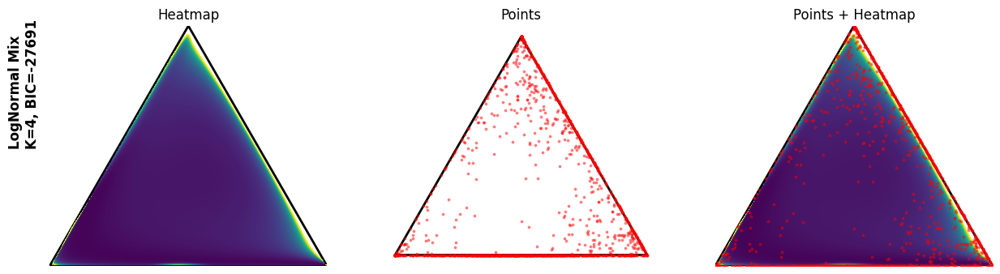

...

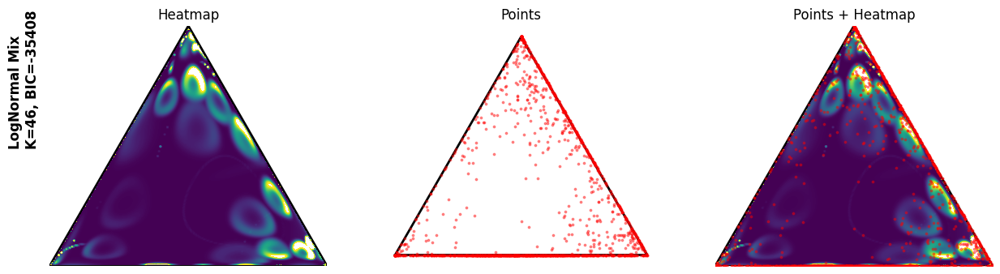

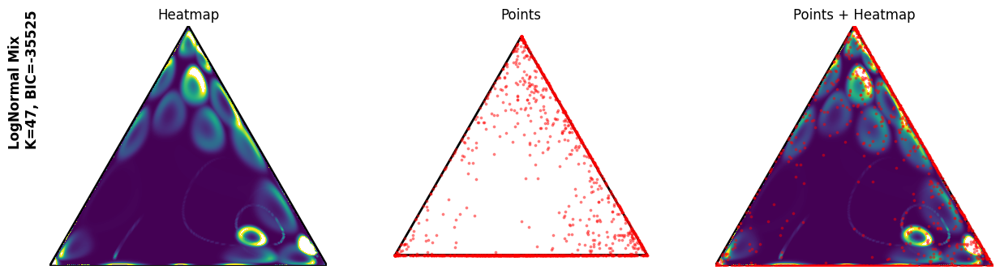

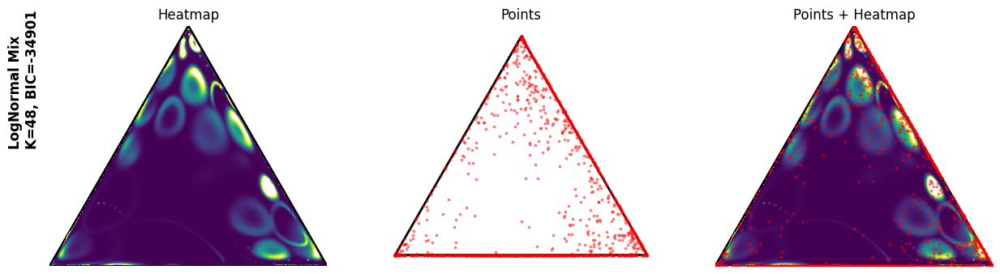

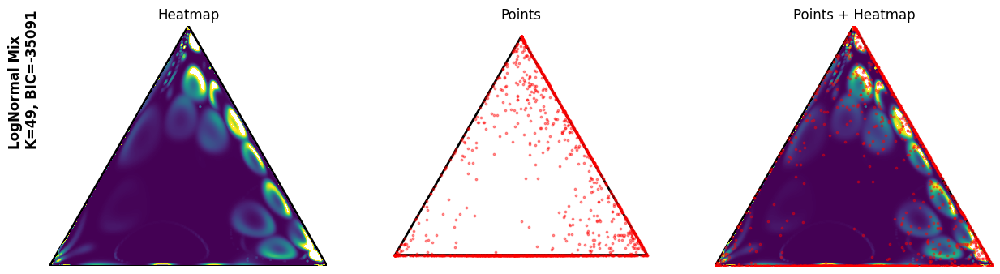

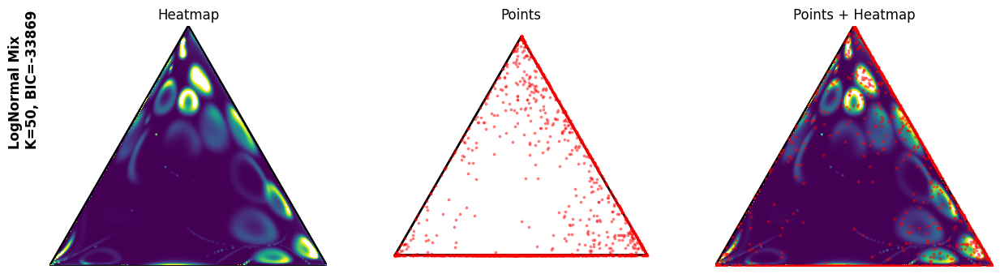

In [29]:
# Plot the results for rand inits
plot_bic_curve(bic_history_rand, best_k_rand)
plot_all_simplexes(model_history_rand, bic_history_rand, abundances, 1, 95, 300)